In [ ]:
import pandas as pd
import numpy as np
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from numpy import unique
from numpy import where

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
df = pd.read_csv('/content/data/football_data.csv')

In [ ]:
df.drop(['Unnamed: 0','ID'],axis=1,inplace=True)
pdf = df.copy()
pdf.drop(pdf.columns[24],axis=1,inplace=True)
objectlst = list(pdf.select_dtypes(include=['object']).columns)
numlst = list(pdf.select_dtypes(include=['float64']).columns)
pdf.drop(objectlst,axis=1)
for i in numlst:
  pdf[i] = pdf[i].apply(lambda x: float(x))
  pdf.fillna(value=pdf[i].mean(),inplace= True)

Calculate Eucledian Distance

In [ ]:
def euclidean_distance(x,c):
    sqrsum = 0
    for i in range(len(x)):
        sqrsum = sqrsum + ((x[i] - c[i]) ** 2)
    return math.sqrt(sqrsum)

Calculate Distance between two points.

In [ ]:
def distance(x,c):
    sqrsum = 0
    for i in range(len(x)):
        sqrsum = sqrsum + ((x[i] - c[i]) ** 2)
    return sqrsum

Calculate Intra class Distortion.

In [ ]:
def calwss(centroid,cluster):
  wss = 0
  for i in range(len(centroid)):
    for j in range(len(cluster[i])):
      wss += distance(cluster[i][j],centroid[i])
  return math.sqrt(wss)

**Pre processing**

In [ ]:
def process_value(s):
  if s[1] == '0':
    return np.nan
  if s == ' ' or s == '' or s == np.nan:
    return np.nan
  s = s[1:len(s)-1]
  return float(s)

In [ ]:
def process_wage(s):
  if s[1] == '0':
    return np.nan
  if s == ' ' or s == '' or s == np.nan:
    return np.nan
  s = s[1:len(s)-1]
  return float(s)

In [ ]:
def process_contract_valid(s):
  if s == ' ' or s == '' or s == np.nan or type(s) is float:
    return np.nan
  if len(s) > 4:
    s = s[-4:len(s)]
  return float(s)

In [ ]:
def process_height(s):
  if s == np.nan or s == ' ' or s == '' or type(s) is float:
    return np.nan
  s = s.split('\'')
  if len(s) == 1:
    return 12*int(s[0])
  else:
    a = 12*int(s[0])
    b = s[1]
    c = float(a)+float(b)
    return c

In [ ]:
def process_weight(s):
  if s == ' ' or s == '' or s == np.nan or type(s) is float:
    return np.nan
  s = s[0:len(s)-3]
  return float(s)

In [ ]:
def process_release_clause(s):
  if s == ' ' or s == '' or s == np.nan or type(s) is float:
    return np.nan
  s = s[1:len(s)-1]
  return float(s)

In [ ]:
def convertfloat(s):
  if s == ' ' or s == '' or s == np.nan or type(s) is float:
    return np.nan
  s = s.split('+')
  return float(int(s[0])+int(s[1]))

In [ ]:
pdf = df.copy()
pdf['Value'] = pdf['Value'].apply(process_value)
pdf['Wage'] = pdf['Wage'].apply(process_wage)
pdf['Height'] = pdf['Height'].apply(process_height)
pdf['Weight'] = pdf['Weight'].apply(process_weight)
pdf['Release Clause'] = pdf['Release Clause'].apply(process_release_clause)
pdf['Contract Valid Until'] = pdf['Contract Valid Until'].apply(process_contract_valid)
pdf['LS'] = pdf['LS'].apply(convertfloat)
pdf['ST'] = pdf['ST'].apply(convertfloat)
pdf['RS'] = pdf['RS'].apply(convertfloat)
pdf['LW'] = pdf['LW'].apply(convertfloat)
pdf['LF'] = pdf['LF'].apply(convertfloat)
pdf['CF'] = pdf['CF'].apply(convertfloat)
pdf['RF'] = pdf['RF'].apply(convertfloat)
pdf['RW'] = pdf['RW'].apply(convertfloat)
pdf['LAM'] = pdf['LAM'].apply(convertfloat)
pdf['CAM'] = pdf['CAM'].apply(convertfloat)
pdf['RAM'] = pdf['RAM'].apply(convertfloat)
pdf['LM'] = pdf['LM'].apply(convertfloat)
pdf['LCM'] = pdf['LCM'].apply(convertfloat)
pdf['CM'] = pdf['CM'].apply(convertfloat)
pdf['RCM'] = pdf['RCM'].apply(convertfloat)
pdf['RM'] = pdf['RM'].apply(convertfloat)
pdf['LWB'] = pdf['LWB'].apply(convertfloat)
pdf['LDM'] = pdf['LDM'].apply(convertfloat)
pdf['CDM'] = pdf['CDM'].apply(convertfloat)
pdf['RDM'] = pdf['RDM'].apply(convertfloat)
pdf['RWB'] = pdf['RWB'].apply(convertfloat)
pdf['LB'] = pdf['LB'].apply(convertfloat)
pdf['LCB'] = pdf['LCB'].apply(convertfloat)
pdf['CB'] = pdf['CB'].apply(convertfloat)
pdf['RCB'] = pdf['RCB'].apply(convertfloat)
pdf['RB'] = pdf['RB'].apply(convertfloat)

In [ ]:
objectlst = list(pdf.select_dtypes(include=['object']).columns)
pdf.drop(objectlst,axis =1, inplace=True)

In [ ]:
for i in pdf.columns:
  pdf.fillna(value=pdf[i].mean(),inplace= True)

In [ ]:
ss = MinMaxScaler()
sdf = ss.fit_transform(pdf)

In [ ]:
X_train = np.array(sdf)

In [ ]:
wss = []
sil_score = []

**K-Means for K = 3**

In [ ]:
k = 3
iteration = 10
centroids = X_train[np.random.choice(X_train.shape[0],k,replace = False)]
clusters = np.zeros(X_train.shape[0])
cluster = []
for it in range(iteration):
  cluster_dist_1 = -1
  cluster_dist_2 = -1
  cluster_dist_3 = -1
  for i in range(X_train.shape[0]):
    cluster_dist_1 = euclidean_distance(X_train[i],centroids[0])
    cluster_dist_2 = euclidean_distance(X_train[i],centroids[1])
    cluster_dist_3 = euclidean_distance(X_train[i],centroids[2])
    min_dist = min(cluster_dist_1,cluster_dist_2,cluster_dist_3)
    if(min_dist == cluster_dist_1):
      clusters[i] = 1
    elif(min_dist == cluster_dist_2):
      clusters[i] = 2
    elif(min_dist == cluster_dist_3):
      clusters[i] = 3
  np_c1 = []
  np_c2 = []
  np_c3 = []
    
  for i in range(clusters.shape[0]):
    if(clusters[i] == 1):
      np_c1.append(X_train[i])
  for i in range(clusters.shape[0]):
    if(clusters[i] == 2):
      np_c2.append(X_train[i])
  for i in range(clusters.shape[0]):
    if(clusters[i] == 3):
      np_c3.append(X_train[i])

  np_c11 = np.array(np_c1)
  np_c21 = np.array(np_c2)
  np_c31 = np.array(np_c3)

  if it == 9:
    cluster.append(np_c11)
    cluster.append(np_c21)
    cluster.append(np_c31)
    
  centroids[0] = np.mean(np_c11,axis=0)
  centroids[1] = np.mean(np_c21,axis=0)
  centroids[2] = np.mean(np_c31,axis=0)

centroid = [centroids[0],centroids[1],centroids[2]]
wss.append(calwss(centroid,cluster))
sil_score.append(silhouette_score(X_train,clusters))

**Finding Correlation Matrix and correlated attributes**

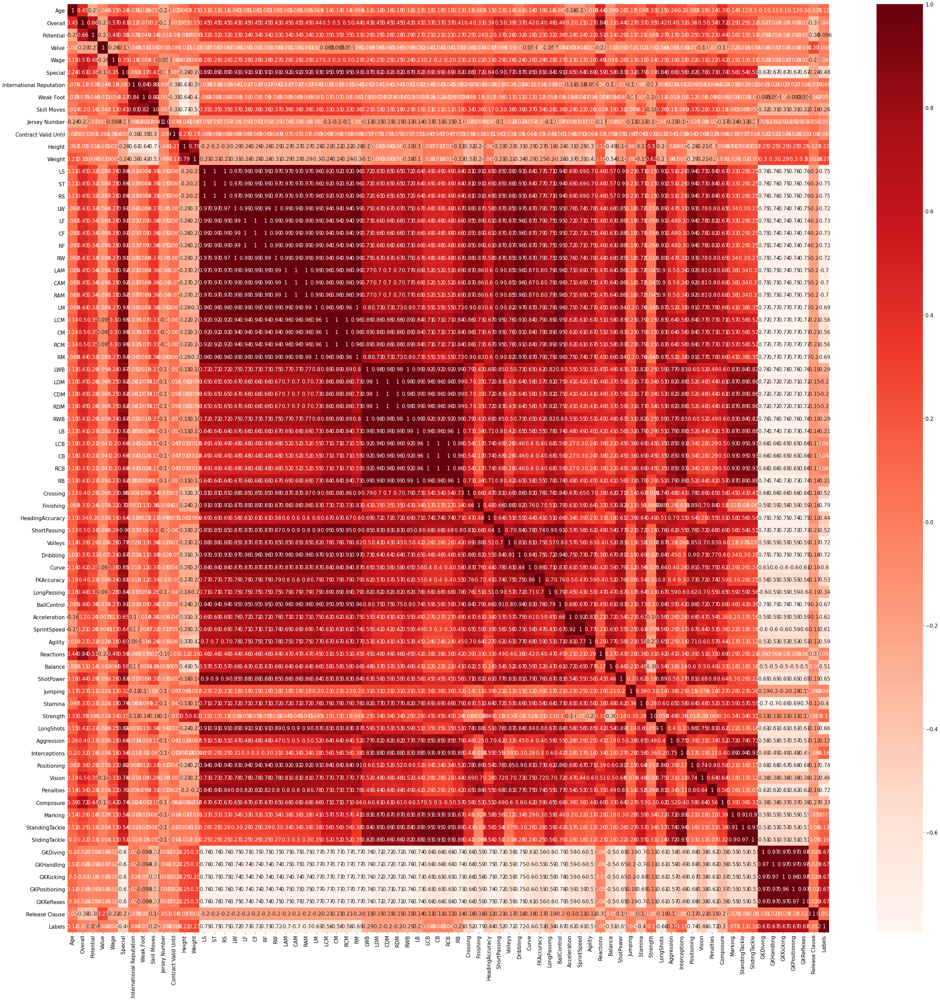

In [ ]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(50,50),)
tdf = pdf.copy()
tdf['Labels'] = clusters
cor = tdf.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [ ]:
cor_target = abs(cor["Labels"])
relevant_features = cor_target[cor_target>0.7]
relevant_features

LS             0.746949
ST             0.746949
RS             0.746949
LW             0.723879
LF             0.733574
CF             0.733574
RF             0.733574
RW             0.723879
LAM            0.702528
CAM            0.702528
RAM            0.702528
Finishing      0.793452
Volleys        0.720719
Dribbling      0.717527
Positioning    0.736313
Penalties      0.717474
Labels         1.000000
Name: Labels, dtype: float64

**Distortion and Silhouette Score**

In [ ]:
print(wss[0])
print(sil_score[0])

144.46690263516706
0.2642333953482011


**Cluster Names**

In [ ]:
dic = {}
for i in range(len(cluster)):
  means = []
  for j in range(13,39):
    means.append(cluster[i][:,j].mean())
  if means.index(max(means))+15 not in dic:
    dic[means.index(max(means))+15] = max(means)
  else:
    s_means = set(means)
    s_means.remove(max(s_means))
    means = list(s_means)
    dic[means.index(max(means))+15] = max(means)
columns = pdf.columns
for i in dic:
  print(columns[i])

CB
CM
RCB


**Number of Points in CLusters**

In [ ]:
print("\nCluster 1:", (clusters == 1).sum())
print("\nCluster 2:", (clusters == 2).sum())
print("\nCluster 3:", (clusters == 3).sum())


Cluster 1: 8003

Cluster 2: 8122

Cluster 3: 2082


**Cluster Visualization**

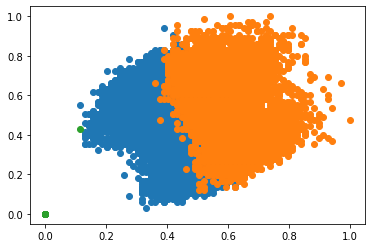

In [ ]:
cluster = unique(clusters)
for cls in cluster:
	row_ix = where(clusters == cls)
	plt.scatter(X_train[row_ix, 15], X_train[row_ix, 36])

**KMeans for K = 5**

In [ ]:
k = 5
iteration = 10
centroids = X_train[np.random.choice(X_train.shape[0],k,replace = False)]
clusters = np.zeros(X_train.shape[0])
cluster = []
for it in range(iteration):
    cluster_dist_1 = -1
    cluster_dist_2 = -1
    cluster_dist_3 = -1
    cluster_dist_4 = -1
    cluster_dist_5 = -1
    for i in range(X_train.shape[0]):
        cluster_dist_1 = euclidean_distance(X_train[i],centroids[0])
        cluster_dist_2 = euclidean_distance(X_train[i],centroids[1])
        cluster_dist_3 = euclidean_distance(X_train[i],centroids[2])
        cluster_dist_4 = euclidean_distance(X_train[i],centroids[3])
        cluster_dist_5 = euclidean_distance(X_train[i],centroids[4])
        min_dist = min(cluster_dist_1,cluster_dist_2,cluster_dist_3,cluster_dist_4,cluster_dist_5)
        if(min_dist == cluster_dist_1):
            clusters[i] = 1
        elif(min_dist == cluster_dist_2):
            clusters[i] = 2
        elif(min_dist == cluster_dist_3):
            clusters[i] = 3
        elif(min_dist == cluster_dist_4):
            clusters[i] = 4
        elif(min_dist == cluster_dist_5):
            clusters[i] = 5
    np_c1 = []
    np_c2 = []
    np_c3 = []
    np_c4 = []
    np_c5 = []
    
    for i in range(clusters.shape[0]):
        if(clusters[i] == 1):
            np_c1.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 2):
            np_c2.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 3):
            np_c3.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 4):
            np_c4.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 5):
            np_c5.append(X_train[i])
    np_c11 = np.array(np_c1)
    np_c21 = np.array(np_c2)
    np_c31 = np.array(np_c3)
    np_c41 = np.array(np_c4)
    np_c51 = np.array(np_c5)

    if it == 9:
      cluster.append(np_c11)
      cluster.append(np_c21)
      cluster.append(np_c31)
      cluster.append(np_c41)
      cluster.append(np_c51)  
    
    centroids[0] = np.mean(np_c11,axis=0)
    centroids[1] = np.mean(np_c21,axis=0)
    centroids[2] = np.mean(np_c31,axis=0)
    centroids[3] = np.mean(np_c41,axis=0)
    centroids[4] = np.mean(np_c51,axis=0)

centroid = [centroids[0],centroids[1],centroids[2],centroids[3],centroids[4]]
wss.append(calwss(centroid,cluster))
sil_score.append(silhouette_score(X_train,clusters))

**Finding Correlation Matrix and The most correlated attributes in the cluster**

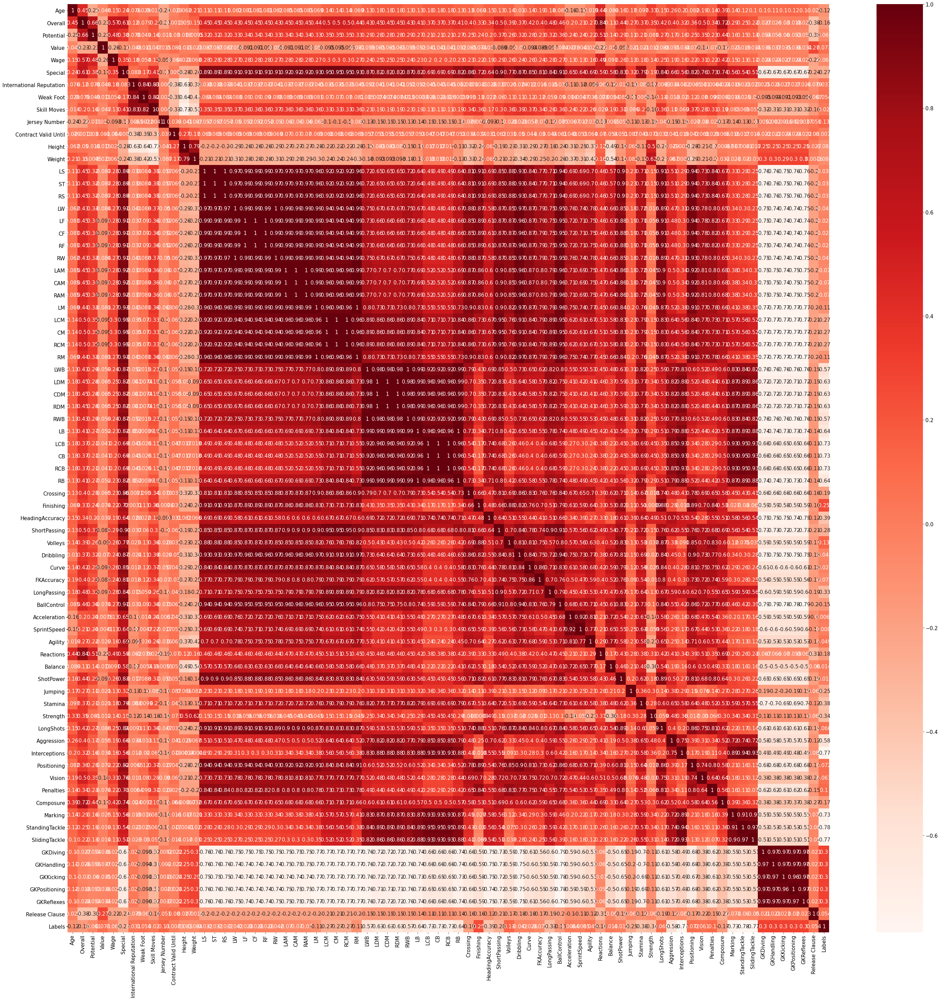

In [ ]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(50,50),)
tdf = pdf.copy()
tdf['Labels'] = clusters
cor = tdf.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [ ]:
cor_target = abs(cor["Labels"])
relevant_features = cor_target[cor_target>0.7]
relevant_features

LCB               0.733584
CB                0.733584
RCB               0.733584
Interceptions     0.771286
Marking           0.728384
StandingTackle    0.778976
SlidingTackle     0.772339
Labels            1.000000
Name: Labels, dtype: float64

**Distortion and Silhouette Score**

In [ ]:
print(wss[1])
print(sil_score[1])

121.0818696932889
0.26591315649501357


**Cluster Names**

In [ ]:
dic = {}
for i in range(len(cluster)):
  means = []
  for j in range(13,39):
    means.append(cluster[i][:,j].mean())
  if means.index(max(means))+15 not in dic:
    dic[means.index(max(means))+15] = max(means)
  else:
    s_means = set(means)
    s_means.remove(max(s_means))
    means = list(s_means)
    dic[means.index(max(means))+15] = max(means)
columns = pdf.columns
for i in dic:
  print(columns[i])

CB
CM
RCB
CF
RS


**Number of Points in a cluster**

In [ ]:
print("\nCluster 1:", (clusters == 1).sum())
print("\nCluster 2:", (clusters == 2).sum())
print("\nCluster 3:", (clusters == 3).sum())
print("\nCluster 4:", (clusters == 4).sum())
print("\nCluster 5:", (clusters == 5).sum())


Cluster 1: 5205

Cluster 2: 2792

Cluster 3: 4379

Cluster 4: 3750

Cluster 5: 2081


**Visualize Cluster**

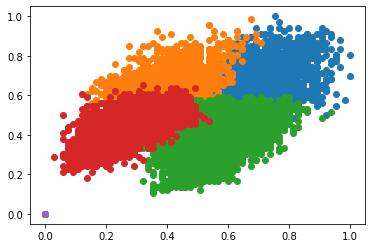

In [ ]:
cluster = unique(clusters)
for cls in cluster:
	row_ix = where(clusters == cls)
	plt.scatter(X_train[row_ix, 36], X_train[row_ix, 26])

**KMeans for K = 7**

In [ ]:
k = 7
iteration = 10
centroids = X_train[np.random.choice(X_train.shape[0],k,replace = False)]
clusters = np.zeros(X_train.shape[0])
cluster = []
for it in range(iteration):
    cluster_dist_1 = -1
    cluster_dist_2 = -1
    cluster_dist_3 = -1
    cluster_dist_4 = -1
    cluster_dist_5 = -1
    cluster_dist_6 = -1
    cluster_dist_7 = -1
    for i in range(X_train.shape[0]):
        cluster_dist_1 = euclidean_distance(X_train[i],centroids[0])
        cluster_dist_2 = euclidean_distance(X_train[i],centroids[1])
        cluster_dist_3 = euclidean_distance(X_train[i],centroids[2])
        cluster_dist_4 = euclidean_distance(X_train[i],centroids[3])
        cluster_dist_5 = euclidean_distance(X_train[i],centroids[4])
        cluster_dist_6 = euclidean_distance(X_train[i],centroids[5])
        cluster_dist_7 = euclidean_distance(X_train[i],centroids[6])
        min_dist = min(cluster_dist_1,cluster_dist_2,cluster_dist_3,cluster_dist_4,cluster_dist_5,cluster_dist_6,cluster_dist_7)
        if(min_dist == cluster_dist_1):
            clusters[i] = 1
        elif(min_dist == cluster_dist_2):
            clusters[i] = 2
        elif(min_dist == cluster_dist_3):
            clusters[i] = 3
        elif(min_dist == cluster_dist_4):
            clusters[i] = 4
        elif(min_dist == cluster_dist_5):
            clusters[i] = 5
        elif(min_dist == cluster_dist_6):
            clusters[i] = 6
        elif(min_dist == cluster_dist_7):
            clusters[i] = 7
    np_c1 = []
    np_c2 = []
    np_c3 = []
    np_c4 = []
    np_c5 = []
    np_c6 = []
    np_c7 = []
    
    for i in range(clusters.shape[0]):
        if(clusters[i] == 1):
            np_c1.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 2):
            np_c2.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 3):
            np_c3.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 4):
            np_c4.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 5):
            np_c5.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 6):
            np_c6.append(X_train[i])
    for i in range(clusters.shape[0]):
        if(clusters[i] == 7):
            np_c7.append(X_train[i])

    np_c11 = np.array(np_c1)
    np_c21 = np.array(np_c2)
    np_c31 = np.array(np_c3)
    np_c41 = np.array(np_c4)
    np_c51 = np.array(np_c5)
    np_c61 = np.array(np_c6)
    np_c71 = np.array(np_c7)

    if it == 9:
      cluster.append(np_c11)
      cluster.append(np_c21)
      cluster.append(np_c31)
      cluster.append(np_c41)
      cluster.append(np_c51)
      cluster.append(np_c61)
      cluster.append(np_c71) 
    
    centroids[0] = np.mean(np_c11,axis=0)
    centroids[1] = np.mean(np_c21,axis=0)
    centroids[2] = np.mean(np_c31,axis=0)
    centroids[3] = np.mean(np_c41,axis=0)
    centroids[4] = np.mean(np_c51,axis=0)
    centroids[5] = np.mean(np_c61,axis=0)
    centroids[6] = np.mean(np_c71,axis=0)

centroid = [centroids[0],centroids[1],centroids[2],centroids[3],centroids[4],centroids[5],centroids[6]]
wss.append(calwss(centroid,cluster))
sil_score.append(silhouette_score(X_train,clusters))

**Finding Correlation MAtrix and the best correlated attributes in the cluster**

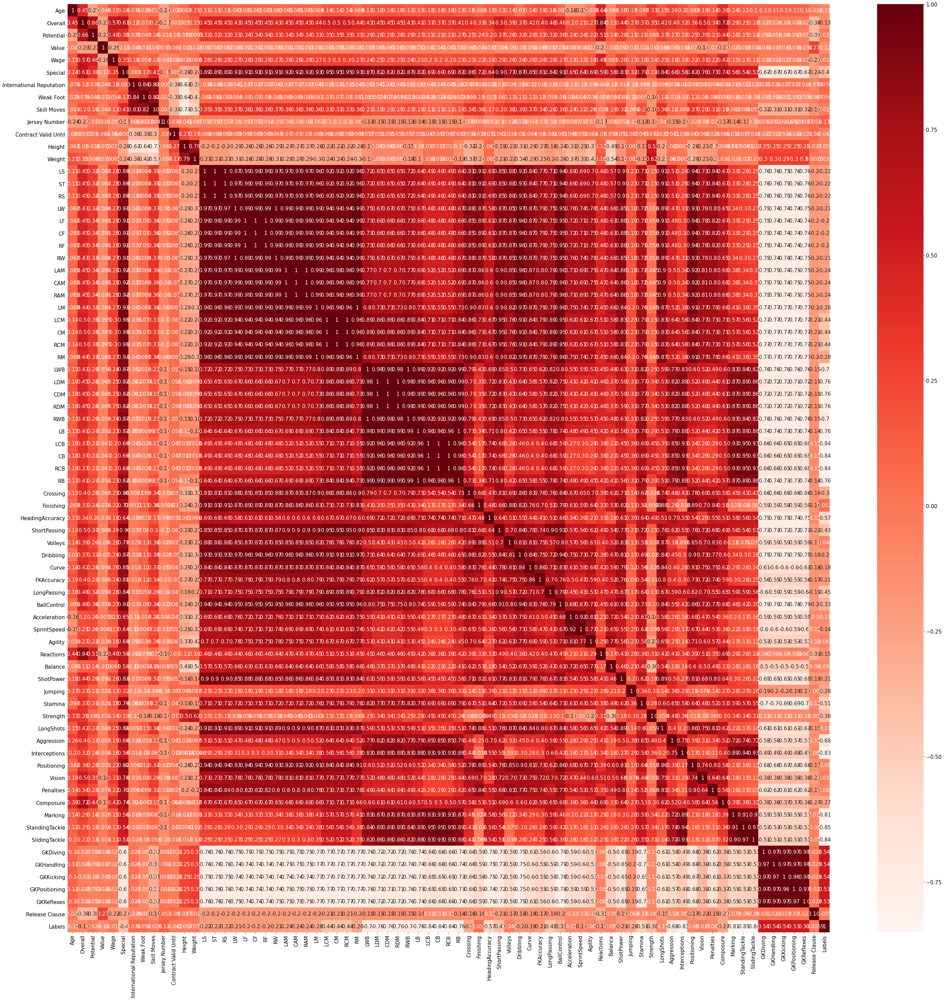

In [ ]:
plt.rcParams.update({'font.size': 15})
plt.figure(figsize=(50,50),)
tdf = pdf.copy()
tdf['Labels'] = clusters
cor = tdf.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [ ]:
cor_target = abs(cor["Labels"])
relevant_features = cor_target[cor_target>0.7]
relevant_features

LWB               0.701301
LDM               0.757462
CDM               0.757462
RDM               0.757462
RWB               0.701301
LB                0.758790
LCB               0.840374
CB                0.840374
RCB               0.840374
RB                0.758790
Interceptions     0.825558
Marking           0.809463
StandingTackle    0.850648
SlidingTackle     0.838493
Labels            1.000000
Name: Labels, dtype: float64

**Distortion and Silhouette Score**

In [ ]:
print(wss[2])
print(sil_score[2])

113.02885514386578
0.23197585243758004


**Cluster Names**

In [ ]:
dic = {}
for i in range(len(cluster)):
  means = []
  for j in range(13,39):
    means.append(cluster[i][:,j].mean())
  if means.index(max(means))+15 not in dic:
    dic[means.index(max(means))+15] = max(means)
  else:
    s_means = set(means)
    s_means.remove(max(s_means))
    means = list(s_means)
    dic[means.index(max(means))+15] = max(means)
columns = pdf.columns
for i in dic:
  print(columns[i])

CF
CB
LAM
RCM
RCB
LW
RS


**Number of Points in Cluster**

In [ ]:
print("\nCluster 1:", (clusters == 1).sum())
print("\nCluster 2:", (clusters == 2).sum())
print("\nCluster 3:", (clusters == 3).sum())
print("\nCluster 4:", (clusters == 4).sum())
print("\nCluster 5:", (clusters == 5).sum())
print("\nCluster 6:", (clusters == 6).sum())
print("\nCluster 7:", (clusters == 7).sum())


Cluster 1: 2764

Cluster 2: 3709

Cluster 3: 2415

Cluster 4: 1606

Cluster 5: 2966

Cluster 6: 2668

Cluster 7: 2079


**Cluster visualize**

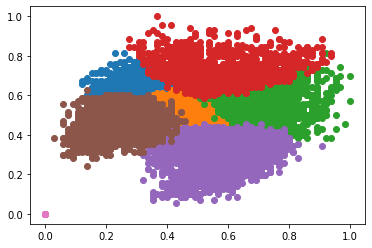

In [ ]:
cluster = unique(clusters)
for cls in cluster:
	row_ix = where(clusters == cls)
	plt.scatter(X_train[row_ix, 36], X_train[row_ix, 21])
plt.show()

**Plotting Graph of K vs Intra class distortion**

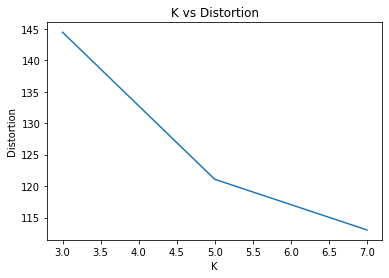

In [ ]:
K = [3,5,7]
plt.plot(K, wss) 
plt.title('K vs Distortion') 
plt.xlabel('K')
plt.ylabel('Distortion')
plt.show()

**Plotting Graph of K vs Silhouette Score.**

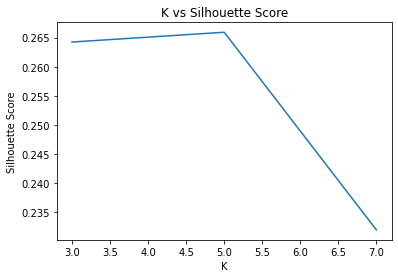

In [ ]:
K = [3,5,7]
plt.plot(K, sil_score) 
plt.title('K vs Silhouette Score') 
plt.xlabel('K')
plt.ylabel('Silhouette Score')
plt.show()

**Finding Outliers**

In [ ]:
wss = []
distance = []
for i in range(len(centroid)):
  for j in range(len(cluster[i])):
    x = cluster[i][j]
    c = centroid[i]
    sqrsum = []
    for k in range(len(x)):
        sqrsum.append((x[k] - c[k]) ** 2)
    wss.append(sum(sqrsum))
    distance.append(sqrsum)

In [ ]:
import heapq
fr = distance[15623]
heapq.nlargest(3, range(len(fr)), key=fr.__getitem__)

[10, 16, 20]

In [ ]:
print(pdf.columns[10])
print(pdf.columns[16])
print(pdf.columns[20])

Contract Valid Until
LW
RW


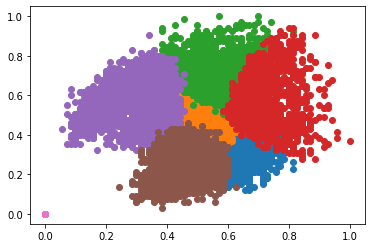

In [ ]:
cluster = unique(clusters)
for cls in cluster:
	row_ix = where(clusters == cls)
	plt.scatter(X_train[row_ix, 21], X_train[row_ix, 36])
plt.show()